# Лекция 2. Гидродинамические исследования скважин и пластов.

Основы теории гидродинамических исследований скважин и пластов. Уравнение фильтрации. Основные решения уравнения фильтрации, их приближения. Построение параметров работы скважины с использованием решений уравнения фильтрации. Применение метода суперпозиции для построения решений уравнения фильтрации. Скин-фактор, после-приток (коэффициент влияния ствола скважины). Построение решений с учетом скин-фактора и послепритока и современных методов проведения численных расчетов. Основные цели гидродинамических исследований скважин и пластов. Задачи, решаемые при гидродинамических исследованиях. Ограничения при гидродинамических исследованиях.

---
Материалы курсов "Исследования скважин и пластов" и "Гидродинамические исследования скважин" в РГУ нефти и газа имени И.М.Губкина.

Версия 0.4 от 17.09.2024

Хабибуллин Ринат 2024 г.

## Содержание

1. [Уравнение фильтрации в радиальной форме](#2.1)
    1. [2.1.1 Вывод уравнения фильтрации ](#2.1.1)

Гидродинамические исследования скважин и пластов проводятся с целью построения моделей скважин и пластов на основе наблюдений (замеров) за их работой пригодных для построения прогнозов при управлении скважинами и месторождениями.
В отличии от других видов исследований в основе гидродинамических исследований замеры проводимые в процессе эксплуатации скважин. При эксплуатации режимы работы могут менятся специальным образом. Такой подход лежит в основе классических исследований. Например при проведении исследования методом кривой восстановления давления (КВД) скважину останавливают и наблюдают за динамикой изменения пластового давления. Также при проведенни ГДИС могут использоваться данные нормальной эксплуатации скважин - когда специальных изменений режима работы не проводится, при этом регистрируютися параметры работы скважины.
В основе большинства современных моделей используемых при анализе и интерпретации данных ГДИС лежит уравнение фильтрации. Решения уравнения фильтрации могут быть построены различными методами, некоторые из них мы рассмотрим в данном курсе.

Для работы с моделями будем использовать python и tNavigator.

# 2.1 Уравнение фильтрации в радиальной форме <a class="anchor" id="2.1"></a>
Уравнение фильтрации описывает движение жидкости в пористой среде. В отечественной литературе часто называют уравнением пьезопроводности, в зарубежной можно встретить название уравнение диффузии (the diffusivity equation).


## 2.1.1 Вывод уравнения фильтрации <a class="anchor" id="2.1.1"></a>
Уравнение фильтрации основано на трех основных уравнениях
* законе сохранения массы
* зависимости связывающей градиент давления с расходом, в простейшем виде это закон Дарси
* уравнении состояния - зависимости связывающей сжимаемость флюида (и отчасти среды) и давлением

Выпишем эти уравнения, чтобы разобраться. Ориентируемся в обозначениях и подходе на [1]. Особое внимание на данном этапе стоит обратить на размерные коэффициенты в уравнениях. С одной стороны записывая уравнения в [СИ] их можно упростить и избежать части сложностей с переводными коэффициентами. С другой стороны во многих источниках переводные коэффициенты интесивно используются и это оказывается удобно при программной реализации алгоритмов. В данном описании ориентируясь на [1] приведем перевод коэффициентов в практические метрические единицы.

### Закон сохранения массы

В дифференциальной форме, для потока в направлении $x$

$$
-f \dfrac{\partial \rho q_x}{\partial x} = A \dfrac{\partial(\rho \phi)}{\partial t} 
\tag{11.1}
\label{11.1}
$$

где 
* $f$ - размерный коэффициент, для практических метрических единиц $f= 0.04167$, для американских промысловых $f = 0.23394$
* $\rho$ - плотность флюида, кг/м$^3$, lbm/ft$^3$
* $q_x$ - объемный расход в направлении $x$, м$^3$/сут, bbl/day, учитываем для практических метрических единиц $1$ м$^3$/сут $= 0.04167$ м$^3$/час и для промысловых американских  $1$ bbl/day $= 0.23394$ ft$^3$/hr  
* x - координата, м, ft
* $\phi$ - пористость, доли единиц
* $t$ - время, часы
* $A$ - площадь, м$^2$, ft$^2$ 

В перечне указаны размерности для промысловых метрических и американских промысловых единиц измерений, там где они отличаются.

Для практических метрических единиц \eqref{11.1} можно записать в виде
$$
-0.04167 \dfrac{ \partial (\rho q_x) }{\partial x} = A \dfrac{\partial(\rho \phi)}{\partial t} 
\tag{11.2}
\label{11.2}
$$


### Закон Дарси

Простейшим вариантом задания зависимости между измением давления и потоком флюида является линейная зависимость - закон Дарси. При этом линейный множитель в зависимости - функция как коллектора (проницаемость), так и свойств флюида (вязкость).

Закон Дарси в направлении $x$.
$$ 
q_x = -  \dfrac{k_x A}{f\mu} \dfrac{\partial p}{\partial x} 
\tag{11.3}
\label{11.3}
$$

где 
* $f$ - размерный коэффициент, для практических метрических единиц $f= 115.74$, для американских промысловых $f = 887.2$
* $k_x$ - проницаемость в направлении движения потока, мД
* $A$ - площадь, м$^2$, ft$^2$ 
* $\mu$ - динамическая вязкость, сП
* $p$ - давление, атм, psi
* $x$ - координата движения потока, м

В практических метрических единицах измерения \eqref{11.3} будет иметь вид
$$ 
q_x = -  \dfrac{k_x A}{115.74\mu} \dfrac{\partial p}{\partial x} 
\tag{11.4}
\label{11.4}
$$

Пытаясь проверить корректность вывода переводных коэффициентов необходимо учесть что для единиц измерение СИ получим $f=1$, а необходимые переводные коэффициенты можно записать как:
* $q$: $1$ [м$^3$/сек] = $543439$ [bbl/day] = $86400$ [м$^3$/сут]
* $k$: $1$ [м$^2$] = $1.01325 \cdot 10^{15}$ [мД]
* $\mu$: $1$ [Па$\cdot$с] = $1000$ [сП]
* $p$: $1$ [Па] = $0.0001450$ [psi] = $0.00000987$ [атм] 
* $x$: $1$ [м] = $3.28$ [ft] 
* $A$: $1$ [м$^2$] = $10.76$ [ft$^2$]

### Уравнение состояния
В простейшем варианте, который мы будет изучать, предполагается, что сжимаемость постоянна и мала 

$$
c_t = c_{formation} + c_{fluid} = const
\tag{11.5}
\label{11.5}
$$

* $c_t$ - общая сжимаемость (total compressibility)
* $c_{formation}$ - сжимаемость породы (formation compressibility),  $c_{formation} = \dfrac{1}{\phi}\dfrac{\partial \phi}{\partial p}$
* $c_{fluid}$ - сжимаемость флюида (fluid compressibility), $c_{fluid} = \dfrac{1}{\rho}\dfrac{\partial \rho}{\partial p}$

### Уравнение фильтрации
Подставим выражение для закона Дарси \eqref{11.4} в уравнение мат баланса  \eqref{11.2}

$$ 
0.04167 \dfrac{ \partial}{\partial x} { \left[ \rho   \dfrac{k_x A}{115.74\mu} \dfrac{\partial p}{\partial x} \right] } = A \dfrac{\partial(\rho \phi)}{\partial t}  
\tag{11.6}
\label{11.6}
$$

Упрощая \eqref{11.6} получим

$$ 
\frac{\partial (\rho \phi)}{\partial t} = 0.00036 k_x \dfrac{ \partial}{\partial x}\left[ \dfrac{\rho}{\mu}\dfrac{\partial p}{\partial x} \right] 
\tag{11.7}
\label{11.7}
$$

Уравнение \eqref{11.7} подходит для потока газа. Для жидкости, предполагая малую сжимаемость флюида можно его упростить до вида

$$ 
\frac{\partial p}{\partial t} = 0.00036 \dfrac{k_x}{\phi \mu c_t} \dfrac{ \partial^2 p}{\partial x^2} 
\tag{11.8}
\label{11.8}
$$

Напомним, здесь
* $p$ - давление, атм
* $t$ - время, час
* $k_x$ - проницаемость в направлении движения потока, мД
* $\mu$ - динамическая вязкость, сП
* $\phi$ - пористость, д.е.
* $c_t$ - сжимаемость, 1/атм
* $x$ - расстояние, м

Приведенное уравнение \eqref{11.8} соответствует линейному потоку в пласте. Практический интерес представляет решение для радиального потока

$$ 
\frac{\partial p}{\partial t} = 0.00036 \dfrac{k}{\phi \mu c_t} \dfrac{1}{r} \left[ \dfrac{\partial}{\partial r} \left( r \dfrac{ \partial p} {\partial r} \right) \right]  
\tag{11.9}
\label{11.9}
$$

Напомним, здесь
* $p$ - давление, атм
* $t$ - время, час
* $k_x$ - проницаемость в направлении движения потока, мД
* $\mu$ - динамическая вязкость, сП
* $\phi$ - пористость, д.е.
* $c_t$ - сжимаемость, 1/атм
* $r$ - расстояние от центра, м
Уравнение фильтрации для радиального потока в линеаризованном виде можно записать в виде

$$ 
\frac{\partial p}{\partial t} = 0.00036 \dfrac{k}{\phi \mu c_t} \dfrac{1}{r} \left[ \dfrac{\partial}{\partial r} \left( r \dfrac{ \partial p} {\partial r} \right) \right]  
\tag{2.1.1}
$$

Напомним, здесь
* $p$ - давление, атм
* $t$ - время, час
* $k$ - проницаемость в направлении движения потока, мД
* $\mu$ - динамическая вязкость, сП
* $\phi$ - пористость, д.е.
* $c_t$ - сжимаемость, 1/атм
* $r$ - расстояние от центра, м

Часто для анализа уравнений неустановившейся фильтрации используются безразмерные переменные. Мы будем использовать переменные в виде:

$$ r_D = \frac{r}{r_w} \tag{2.1.2} $$
$$ t_D = \frac{0.00036 kt}{\phi \mu c_t r_w^2}  \tag{2.1.3}$$
$$ p_D = \frac{kh}{ 18.41 q_{ref} B \mu} \left( p_i - p \right)  \tag{2.1.4} $$
$$ q_D = \frac{q}{q_{ref}} \tag{2.1.5}$$

Здесь использование единицы измерения СИ.
* $r_w$ - радиус скважины, м
* $r$ - расстояние от центра скважины до точки в пласте, м
* $q$ - дебит скважины на поверхности, приведенный к нормальным условиям, м3/сут
* $q_{ref}$ - референсный дебит скважины на поверхности, приведенный к нормальным условиям, м3/сут
* $\phi$ - пористость, доли единиц
* $\mu$ - вязкость нефти в пласте, сП
* $B$ - объемный коэффициент нефти, м3/м3
* $p_i$ - начальное давление в пласте, атм
* $p$ - давление на расстоянии $r$, атм
* $c_t$ - общая сжимаемость системы в пласте, 1/атм

Использование безразмерных переменных позволяет упростить уравнение фильтрации (2.1.1), которое примет вид

$$ 
\frac{\partial p_D}{ \partial t_D} = \dfrac{1}{r_D} \left[ \dfrac{\partial}{\partial r_D} \left( r_D \dfrac{ \partial p_D} {\partial r_D} \right) \right] 
\tag{2.1.6}
$$

Решение этого уравнения - функция безразмерного давления от безразмерных времени и расстояния $p_D(r_D, t_D) $

Для установившегося режима фильтрации давление в пласте не меняется. Для псевдо-установившегося режима постоянным остается перепад давления между пластом и забоем. После запуска, остановки или изменения режима работы скважины эти условия не выполняются. Давление в различных точках пласта может меняться по разному. Такой режим называют неустановившимся, а решения его описывающие нестационарными (зависят от времени).

# 2.2. Построение простого стационарного решения уравнения фильтрации

# 2.2.1. Формула Дюпюи и построение простых решений с python <a class="anchor" id="1"></a>
Простое решение для задачи стационарного притока к вертикальной скважине в однородном изотропном пласте круговой формы с постоянным давлением на границе имеет вид

$$Q=\dfrac{kh}{18.41\mu B} \dfrac{P_{res}-P_{wf}}{\ln \dfrac{r_e}{r_w} + S}
\tag{1}$$

где 

где в свою очередь 
* $Q$ - дебит скважины на поверхности, приведенный к нормальным условиям, ст. м$^3$/сут
* $\mu$ - вязкость нефти в пласте, сП
* $B$ - объемный коэффициент нефти, м$^3$/м$^3$
* $P_{res}$ - пластовое давление или давление на контуре с радиусом $r_e$, атма
* $P_{wf}$ - давление забойное, атма
* $k$ - проницаемость, мД
* $h$ - мощность пласта, м
* $r_e$ - внешний контур дренирования скважины, м
* $r_w$ - радиус скважины, м
* $S$ - скин-фактор скважины, м

Это решение известно как [закон Дарси](https://ru.wikipedia.org/wiki/%D0%97%D0%B0%D0%BA%D0%BE%D0%BD_%D0%94%D0%B0%D1%80%D1%81%D0%B8) или [формула Дюпюи](https://ru.wikipedia.org/wiki/%D0%9F%D1%80%D0%BE%D0%B4%D1%83%D0%BA%D1%82%D0%B8%D0%B2%D0%BD%D0%BE%D1%81%D1%82%D1%8C_(%D0%BD%D0%B5%D1%84%D1%82%D0%B5%D0%B4%D0%BE%D0%B1%D1%8B%D1%87%D0%B0)).

Выражение можно переписать в виде

$$P_{r} = P_{res} - 18.41\dfrac{ Q\mu B }{kh} \left[ \ln\dfrac{r_e}{r} +S \right]
\tag{2}$$

который удобен для расчета распределения давления в пласте $P_r$ на произвольном расстоянии от скважины $r$.
В выражении (2) задано граничное значение давления $p_e$ на контуре $r_e$. Расчет позволит найти любое значение внутри контура, в том числе и забойное давление $P_{wf}$ на $r=r_w$

Выражение можно переписать 
$$P_{r} = P_{wf} + 18.41\dfrac{ Q\mu B }{kh} \left[ \ln\dfrac{r}{r_w} +S \right]
\tag{3}$$

где по известному дебиту и забойному давлению можно найти давление в пласте. При известном пластовом давлении можно оценить радиус контура на котором оно достигается.

In [1]:
# импортируем библиотеки для расчетов

# numpy используем для работы с массивами и подготовки данных для построения графиков. 
# Также в некоторых функциях используем возможности векторных расчетов numpy
import numpy as np

# matplotlib используем для построения графиков
import matplotlib.pyplot as plt


Для удобства дальнейшего изложения и использования расчетных функций при создании функций и переменных на языке python
названия формируются по следующим принципам:
* сначала указывается, что расчитывается в функции, в данном случае - давление $p$
* потом указываются пояснения - в данном случае p_ss - steady state pressure
* в конце указывается размерность в которой ожидается получаение ответа - в данном случае atma - абсолютные атмосферы

In [2]:
def p_ss_atma(p_res_atma = 250,
              q_liq_sm3day = 50,
              mu_cP = 1,
              B_m3m3 = 1.2,
              k_mD = 40,
              h_m = 10,
              r_e_m = 240,
              r_m = 0.1):
  """
  функция расчета давления в произвольной точке пласта 
  на расстоянии r_m от центра скважины
  для стационарного решения уравнения фильтрации 
  p_res_atma - пластовое давление, давление на контуре питания
  q_liq_sm3day - дебит жидкости на поверхности в стандартных условиях
  mu_cP - вязкость нефти (в пластовых условиях)
  B_m3m3 - объемный коэффициент нефти 
  k_mD - проницаемость пласта
  h_m - мощность пласта, м
  r_e_m - радиус контрура питания, м  
  r_m - расстояние на котором проводится расчет, м
  """
  return p_res_atma - 18.41*q_liq_sm3day*mu_cP*B_m3m3/k_mD/h_m*np.log(r_e_m/r_m)


# 2.2.2. Построение графика с использованием **matplotlib** <a class="anchor" id="2"></a>

Самый простой пример построения графиков в python - использование библиотеки matplotlib.

Построим график распределения давления в пласте - воронку депресси ориентируясь на выражение (10.2).

Для формирования графика требуется создать два массива значений - x и y и отобразить их. Для формирования массива используются методы библиотеки numpy.

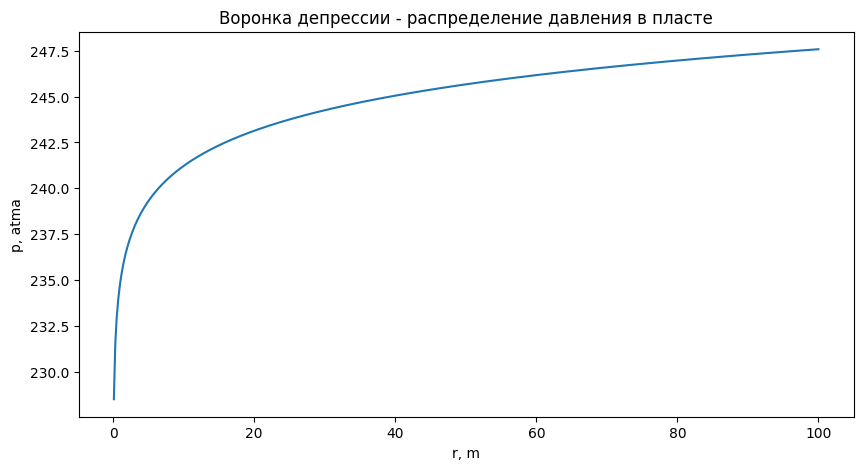

In [3]:
# формируем массив расстояний для которых будем проводить расчет
r_arr = np.linspace(0.1, 100, 500) 

# рассчитываем массив давлений на соответствующих расстояниях
# для расчета используется векторный расчет numpy - нет необходимости делать цикл в явном виде
# для примера показана передача всех аргументов созданной функции
p_arr = p_ss_atma(p_res_atma = 250,
                  q_liq_sm3day = 50,
                  mu_cP = 1,
                  B_m3m3 = 1.2,
                  k_mD = 40,
                  h_m = 10,
                  r_e_m = 240,
                  r_m = r_arr)

# настраиваем отображение графика
plt.rcParams["figure.figsize"] = (10,5)  # регулируем размер графика
# рисуем
plt.plot(r_arr, p_arr)   # команда отрисовки графика по заданным массивам
# настраиваем график
plt.title('Воронка депрессии - распределение давления в пласте')
plt.xlabel('r, m')
plt.ylabel('p, atma')
plt.show()

# 2.2.3. Построение карты давлений с использованием **matplotlib** <a class="anchor" id="3"></a>
Построим карту пластовых давлений с использованием формулы Дюпюи. 

Для построения карты полезно вспомнить, что расстояние от скважины с координатами $(x_{well}, y_{well})$ до произвольной точки пласта с координатами $(x,y)$ можно найти по формуле 
$$r=\sqrt{ (x-x_{well})^2 + (y-y_{well})^2 }
\tag{4}$$

простой вариант расчета  - можно создать пустую матрицу со значениями давления по сетке и перебирая все точки на сетке/матрице рассчитать давления

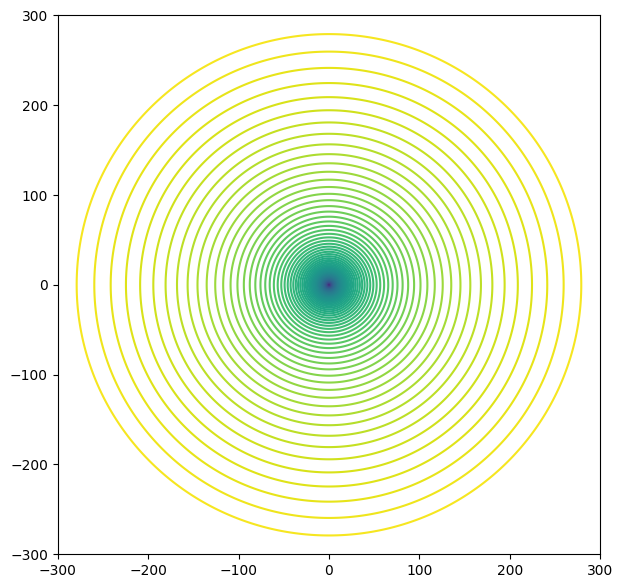

In [4]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координаты скважины
xwell1 = 0
ywell1 = 0

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 500)
y = np.linspace(-r_e, r_e, 500)

# создадим пустую матрицу значений
p_grid = np.zeros((500,500))

# перебираем в цикле все элементы матрицы и рассчитываем давления
for i in range(len(x)):          # пример 1 как получить индексы из списка
    for j,val in enumerate(y):   # пример 2 как получить индексы из списка
        # рассчитываем давления подставляя расстояния
        p_grid[i,j] = p_ss_atma(p_res_atma = 250,
                                q_liq_sm3day = 50,
                                mu_cP = 1,
                                B_m3m3 = 1.2,
                                k_mD = 40,
                                h_m = 10,
                                r_e_m = r_e,
                                r_m = ((x[i]-xwell1)**2 + (y[j]-ywell1)**2)**0.5
                                )
# Удалим из сетки все элементы где давление больше пластового
p_grid = np.where(p_grid>250,250,p_grid)

# построим отображение в виде контурной карты
plt.rcParams["figure.figsize"] = (7,7)
plt.contour(x, y, p_grid, levels=100)
plt.show()

Для ускорения и оптимизации расчета можно для расчета матрицы давлений использовать векторные возможности пакета numpy.
Для построения карты необходимо рассчитать значения давления на регулярной сетке, что можно сделать с использованием функции `np.meshgrid`

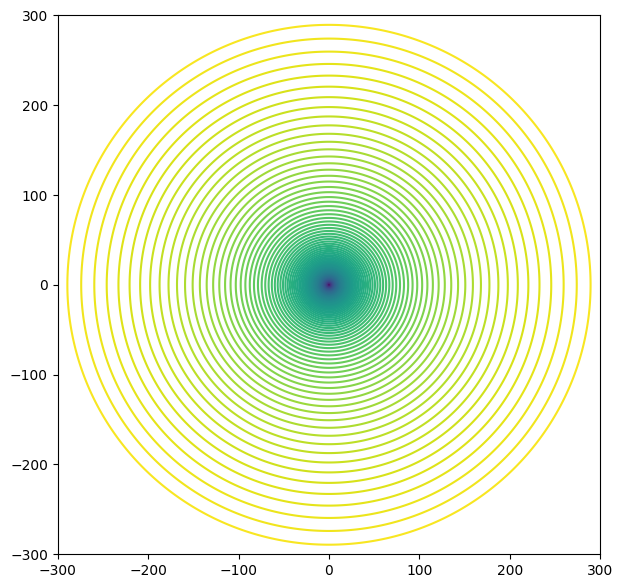

In [5]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 300)
y = np.linspace(-r_e, r_e, 300)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)
# зададим координаты скважины
xwell1 = 0
ywell1 = 0
# рассчитаем значение давлений во всех точках сетки
# расчет ведется для матрицы координата с использованием векторных возможностей numpy
p_mesh = p_ss_atma(r_m=((xv-xwell1)**2 + (yv-ywell1)**2)**0.5, p_res_atma=pres, r_e_m=r_e)
# удалим значения за контуром, так как в данном случае они не имеют смысла
p_mesh[np.where(p_mesh > pres)] = pres
# построим отображение в виде контурной карты
plt.rcParams["figure.figsize"] = (7,7)
plt.contour(x, y, p_mesh, levels=100)
plt.show()

Важно отметить, что для стационарного решения работает принцип суперпозиции - сумма двух решений также будет решением, это позволяет построить карту для нескольких скважин.
Давление в любой точке пласта можно найти по формуле

$$P_{res} - P_{x,y} =  \sum_{i} 18.41\dfrac{ Q_i\mu B }{kh} \left[ \ln\dfrac{r_e}{\sqrt{ (x-x_{w.i})^2 + (y-y_{w.i})^2 }} +S \right]$$


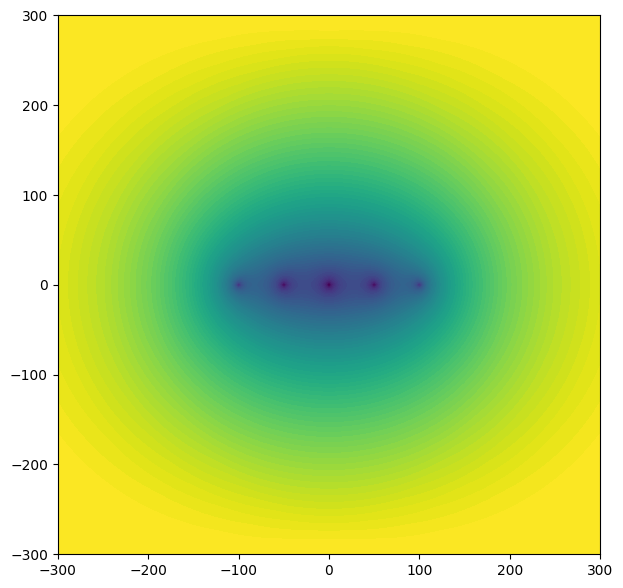

In [6]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 300)
y = np.linspace(-r_e, r_e, 300)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)

# зададим координаты скважины (всего будет 5 скважин у которых меняется только х координата)
xwell = [-100, -50, 0 , 50, 100]
ywell = 0

# зададим пустой список матриц с перепадами давлений от каждой отдельной скважины
p_mesh_i=[]

# для каждой скважины найдем ее влияние на давления
for xi in xwell:
    # рассчитаем матрицу расстояний от элементов сетки до скважины i
    r_well = ((xv-xi)**2 + (yv-ywell)**2)**0.5
    # рассчитаем значение давлений во всех точках сетки для скважины i
    p_mesh_i_ = p_ss_atma(r_m=r_well, p_res_atma=pres, r_e_m=r_e)
    # удалим значения за контуром, так как в данном случае они не имеют смысла
    p_mesh_i_[np.where(p_mesh_i_ > pres)] = pres
    # сохраним влияние скважины i в списке матриц влияния отдельных скважин
    p_mesh_i.append(p_mesh_i_)
    
# найдем суммарное влияние все скважин
p_mesh_sum = 0
for p_mesh_i_ in p_mesh_i:
    # найдем сумму решений, помним что суммировать можно депрессии
    p_mesh_sum = pres - p_mesh_i_ + p_mesh_sum
p_mesh_sum = pres -  p_mesh_sum

# построим отображение в виде контурной карты
plt.rcParams["figure.figsize"] = (7,7)
plt.contourf(x, y, p_mesh_sum, levels=100)
plt.show()

# 2.2.4. Построение карты давлений с использованием plotly <a class="anchor" id="221"></a>

Для построения графиков можно использовать библиотеку `plotly`. Эта библиотека позволяет строить широкий набор графиков. Приведем примеры построения трехмерных поверхностей распределения давления для ранее построенных массивов. Графики получаются интерактивные и их отображение может быть гибко настроено пользователем.

Построение воронки депрессии с использованием базовой тепловой карты. Еще одна из отличительных особенностей библиотеки **Plotly** - это то, что при наведении курсора на график можно сразу посмотреть значения в интерсующей точке на нем (какое значение давления соотвествует координатам x,y):

Построим карту пластовых давлений с использованием формулы Дюпюи. 

Для построения карты необходимо рассчитать значения давления на регулярной сетке, что можно сделать с использованием функции `np.meshgrid`

Для построения карты полезно вспомнить, что расстояние от скважины с координатами $(x_{well}, y_{well})$ до произвольной точки пласта с координатами $(x,y)$ можно найти по формуле 
$$
r=\sqrt{ (x-x_{well})^2 + (y-y_{well})^2 }
\tag{2}
$$

In [8]:
# plotly используем как альтернативный инструмент построения графиков
import plotly.graph_objects as go
from plotly.subplots import make_subplots

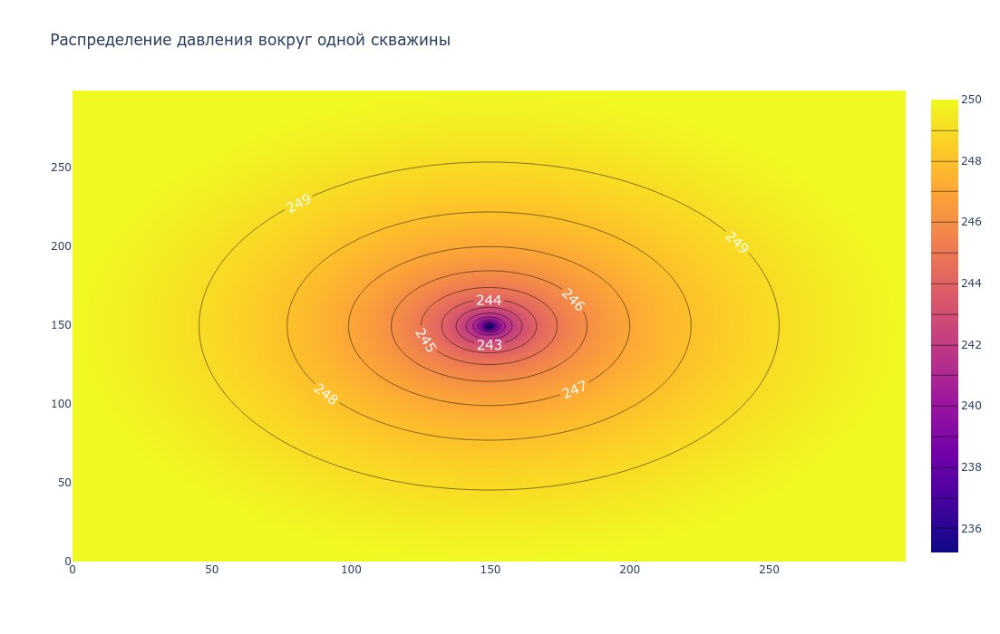

In [10]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 300)
y = np.linspace(-r_e, r_e, 300)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)
# зададим координаты скважины
xwell1 = 0
ywell1 = 0
# рассчитаем значение давлений во всех точках сетки
p_mesh = p_ss_atma(r_m=((xv-xwell1)**2 + (yv-ywell1)**2)**0.5, p_res_atma=pres, r_e_m=r_e)
# удалим значения за контуром, так как в данном случае они не имеют смысла
p_mesh[np.where(p_mesh > pres)] = pres

fig = go.Figure(data=
    go.Contour(
        z = p_mesh,
        contours = dict(
            coloring ='heatmap',
            showlabels = True, # показывать значения на изолиниях или нет
            labelfont = dict( # Параметры шрифта подписей 
                size = 15,
                color = 'white',
            )
        )))
fig.update_layout(
    title='Распределение давления вокруг одной скважины',
    width = 700, height = 700, 
    autosize = False)
fig.show()

# 2. Построение **воронки депрессии** в 3D с использованием plotly <a class="anchor" id="222"></a>

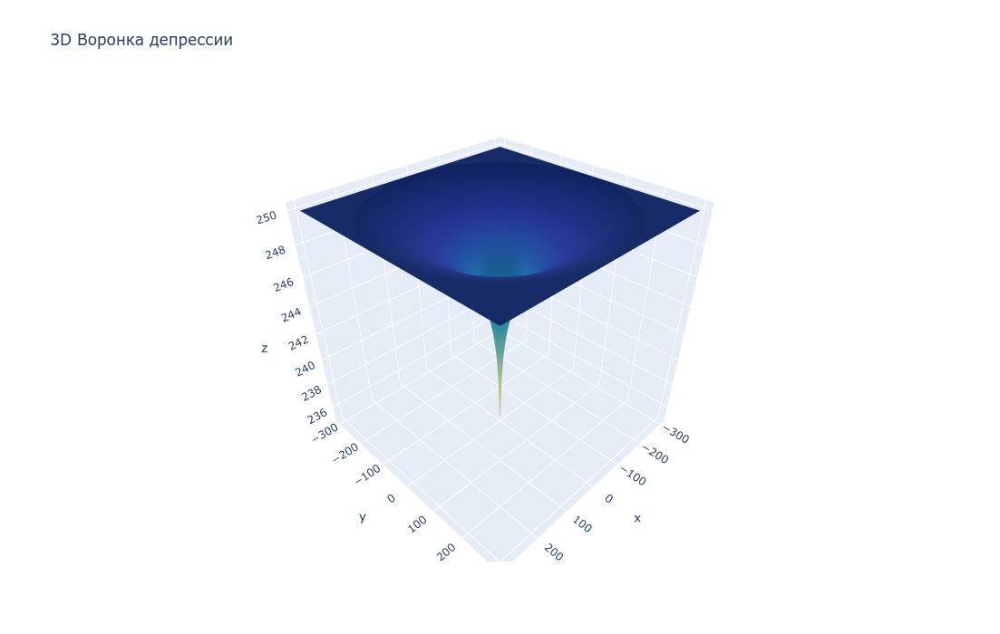

In [11]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]]
)

fig.add_trace(
    go.Surface(x=x, y=y, z=p_mesh, colorscale='YlGnBu', showscale=False),
    row=1, col=1)
fig.update_layout(
    title_text='3D Воронка депрессии',
    height=700,
    width=700
)

fig.show()

# 3. Построение карты давлений для нескольких скважин с plotly <a class="anchor" id="223"></a>

Суперпозиция для стационарного решения

Перепад давления в произвольной точке пласта с координатами $(x,y)$ можно оценить как
$$
P_{res} - P_{x,y} = \sum_{i} 18.41\dfrac{ Q_i\mu B }{kh} \left[ \ln\dfrac{r_e}{\sqrt{ (x-x_{i})^2 + (y-y_{i})^2 }} +S \right]  
$$

В этом выражении пласт предполагается однородным изотроптым с постоянными свойствами.

In [15]:
# зададим параметры воронки депрессии
pres = 250 
r_e = 300

# зададим координатную сетку основываясь на параметрах
x = np.linspace(-r_e, r_e, 300)
y = np.linspace(-r_e, r_e, 300)
# рассчитаем вспомогательные вектора для построения сетки
xv, yv = np.meshgrid(x, y)

# зададим координаты скважины (всего будет 5 скважин у которых меняется только х координата)
xwell = [-100, -50, 0 , 50, 100]
ywell = 0

# зададим пустой список сеток с перепадами давлений от каждой отдельной скважины
p_mesh_i=[]

# для каждой скважины найдем ее влияние на давления
for xi in xwell:
    # рассчитаем значение давлений во всех точках сетки для скважины i
    p_mesh_i_ = p_ss_atma(r_m=((xv-xi)**2 + (yv-ywell)**2)**0.5, p_res_atma=pres, r_e_m=r_e)
    # удалим значения за контуром, так как в данном случае они не имеют смысла
    p_mesh_i_[np.where(p_mesh_i_ > pres)] = pres
    p_mesh_i.append(p_mesh_i_)
    
# найдем суммарное влияние все скважин
p_mesh_sum = 0
for p_mesh_i_ in p_mesh_i:
    # найдем сумму решений, помним что суммировать можно депрессии
    p_mesh_sum = pres - p_mesh_i_ + p_mesh_sum
p_mesh_sum = pres -  p_mesh_sum



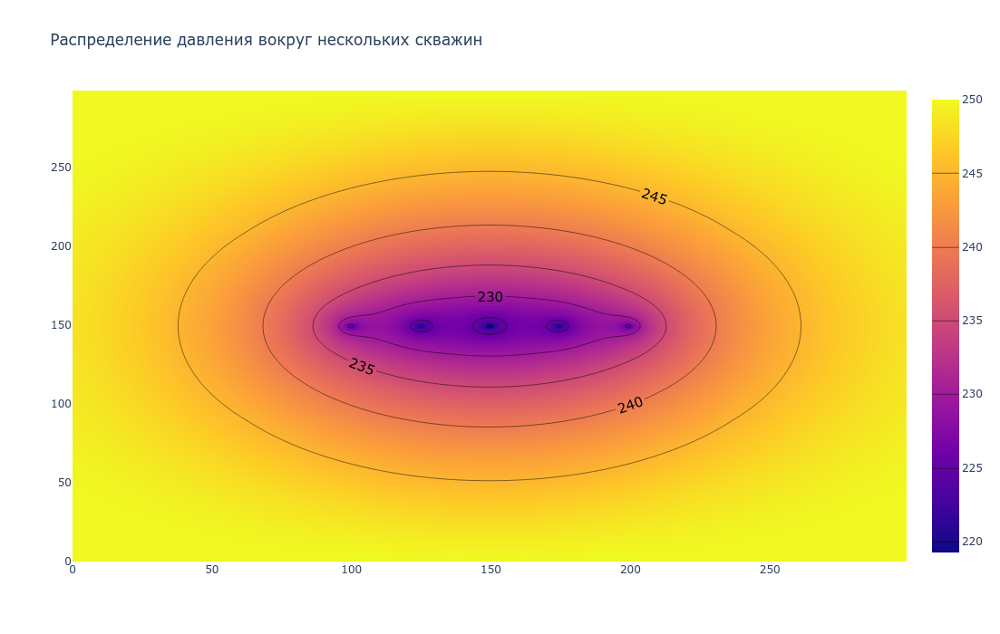

In [16]:
fig = go.Figure(data=
    go.Contour(
        z = p_mesh_sum,
        contours = dict(
            coloring ='heatmap',
            showlabels = True, # показать значения на изолиниях
            labelfont = dict( # Параметры шрифта подписей 
                size = 15,
                color = 'black',
            )
        )))
fig.update_layout(
    title='Распределение давления вокруг нескольких скважин',
    width = 700, height = 700, 
    autosize = False)
fig.show()

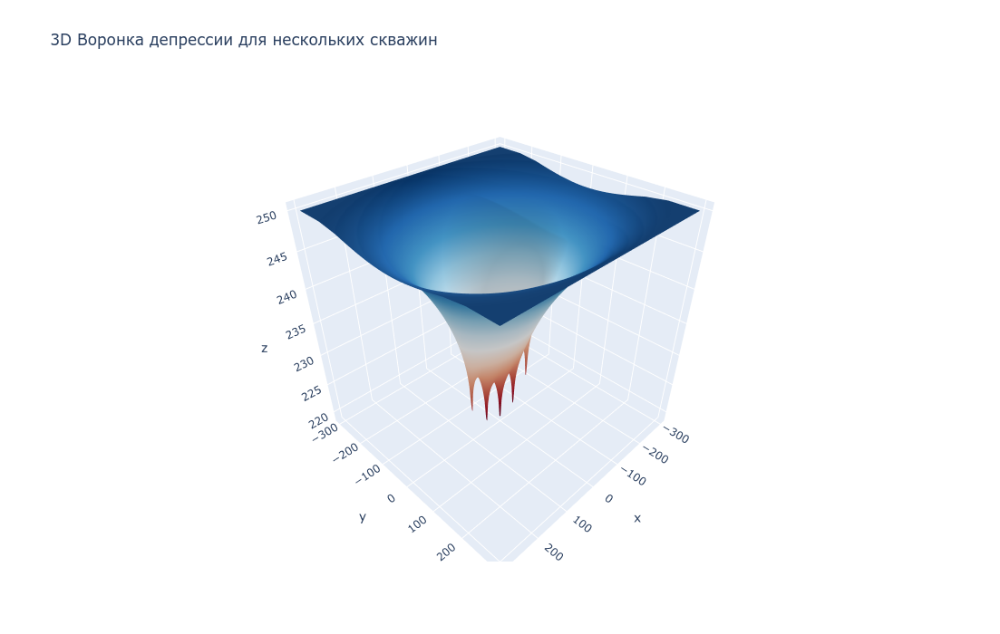

In [14]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]]
)

fig.add_trace(
    go.Surface(x=x, y=y, z=p_mesh_sum, colorscale='RdBu', showscale=False),
    row=1, col=1)
fig.update_layout(
    title_text='3D Воронка депрессии для нескольких скважин',
    height=700,
    width=700
)

fig.show()

# 2.2.4 Задания для самостоятельной работы <a class="anchor" id="4"></a>

Для совершенствования навыков работы с python выполните следующие задания:

1. Постройте график распределения давления в пласте для композитного пласта. В композитном пласте на расстоянии $r<r_1$ проницаемость равна $k=k_1$, а для $r>=r_1$, $k=k_2$. 
2. Постройте двумерную тепловую карту распределения давления в пласте для моделей однородного пласта и композитного пласта. 
3. Рассчитайте среднюю величину давления в круговой области дренирования для однородного пласта. Насколько среднее давление в круговой области дренирования будет отличаться от давления на контуре. Чему будет равен коэффициент $S$ в выражении  $Q=\dfrac{kh}{18.41\mu B} \dfrac{P_{res}-P_{wf}}{ln(\dfrac{r_e}{r_w})+S}$ при использовании вместо давления на контуре среднего давления? Постройте график, на котором будет отображаться распределение давления в зоне дренирования и величина среднего давления (в виде линии).
4. Для примера с несколькими скважинами имитирующими трещину ГРП рассчитайте дебиты скважин таким образом, чтобы забойное давление на всех скважинах было одинаковым. Постройте графики распределения давления в пласте. Постройте график дебитов вдоль "скважины".